In [1]:
import numpy as np
from DPSU import DPSU
from DPNE import DPNE
import os
from util import estimate_valid_k_grams, check_validity
import matplotlib.pyplot as plt
import pandas as pd
import time

In [2]:
data = []

file_name = 'users.txt'
with open(os.path.join(file_name), 'r') as f:
    for line in f:
        data.append(line.strip())

user_data = data

In [3]:
# user_data

In [4]:
# Break using " " or "," or ".")
for i in range(len(user_data)):
    # user_data[i] = user_data[i].replace(",", "")
    user_data[i] = user_data[i].replace(".", "")
    user_data[i] = user_data[i].replace("\'", "")
    user_data[i] = user_data[i].replace("\"", "")
# user_data = [user.split(" ") for user in user_data]

In [5]:
# DPSU_obj = DPSU(delta1=100, rho1=0.3, sigma1=0.1, delta2=100, rho2=0.3, sigma2=0.2)
# s1, s2 = DPSU_obj.calculate_S(user_data)
# print("S1: ", s1)
# print("S2: ", s2)

# Checking estimate_valid_k_grams

In [6]:
# s1 = list(s1)
# s2 = list(s2)
# estimate_valid_k_grams(s1,s2,1)

In [7]:
# res = 0
# for i in range(10000):
#     res += estimate_valid_k_grams(s1, s2, 1)

# print(res/10000)

In [8]:
# user_data

In [9]:
# Parameters
epsilon = 800
delta = 1e-5
p = 0.01
T = 9  

# Run the DPNE algorithm
dpne = DPNE(user_data, epsilon, delta, p, T, Deltas=[1000]*T)
output = dpne.run()

/data/CS798/DP-N-grams/DPNE.py:67: RuntimeWarning: overflow encountered in exp
  term2 = np.exp(self.epsilon) * norm.cdf(-self.epsilon * sigma - 1/(2*sigma))
/data/CS798/DP-N-grams/DPNE.py:67: RuntimeWarning: invalid value encountered in scalar multiply
  term2 = np.exp(self.epsilon) * norm.cdf(-self.epsilon * sigma - 1/(2*sigma))


Delta_0 :  1000
Sigma_0 :  3.0000000000000004e-05
Rho_0 :  1.000132515202404
data :  [['chapter', '1', 'the', 'earthquake', 'the', 'train', 'from', 'frisco', 'was', 'very', 'late', 'it', 'should', 'have', 'arrived', 'at', 'hugsons', 'siding', 'at', 'midnight', 'but', 'it', 'was', 'already', 'five', 'oclock', 'and', 'the', 'gray', 'dawn', 'was', 'breaking', 'in', 'the', 'east', 'when', 'the', 'little', 'train', 'slowly', 'rumbled', 'up', 'to', 'the', 'open', 'shed', 'that', 'served', 'for', 'the', 'stationhouse', 'as', 'it', 'came', 'to', 'a', 'stop', 'the', 'conductor', 'called', 'out', 'in', 'a', 'loud', 'voice', 'hugsons', 'siding', 'at', 'once', 'a', 'little', 'girl', 'rose', 'from', 'her', 'seat', 'and', 'walked', 'to', 'the', 'door', 'of', 'the', 'car', 'carrying', 'a', 'wicker', 'suitcase', 'in', 'one', 'hand', 'and', 'a', 'round', 'birdcage', 'covered', 'up', 'with', 'newspapers', 'in', 'the', 'other', 'while', 'a', 'parasol', 'was', 'tucked', 'under', 'her', 'arm', 'the', 'cond

In [10]:
len(output)

9

In [11]:
output

[{'a',
  'about',
  'after',
  'again',
  'air',
  'all',
  'an',
  'and',
  'another',
  'answered',
  'any',
  'are',
  'around',
  'as',
  'asked',
  'at',
  'away',
  'back',
  'be',
  'beautiful',
  'because',
  'been',
  'before',
  'being',
  'big',
  'boy',
  'buggy',
  'but',
  'by',
  'came',
  'can',
  'come',
  'could',
  'country',
  'cried',
  'did',
  'do',
  'dont',
  'dorothy',
  'down',
  'each',
  'earth',
  'eat',
  'enough',
  'eureka',
  'even',
  'ever',
  'eyes',
  'few',
  'first',
  'for',
  'friends',
  'from',
  'gargoyles',
  'get',
  'girl',
  'glass',
  'go',
  'good',
  'great',
  'had',
  'has',
  'have',
  'he',
  'head',
  'her',
  'here',
  'him',
  'his',
  'horse',
  'how',
  'i',
  'if',
  'illustration',
  'im',
  'in',
  'into',
  'is',
  'it',
  'its',
  'jim',
  'just',
  'kitten',
  'know',
  'land',
  'let',
  'like',
  'little',
  'long',
  'look',
  'looked',
  'made',
  'make',
  'man',
  'mangaboos',
  'many',
  'may',
  'me',
  'more',


In [12]:
for i in range(0, T):
    print("# of ", i+1, "-grams: ", len(output[i]))

# of  1 -grams:  184
# of  2 -grams:  4659
# of  3 -grams:  7264
# of  4 -grams:  5533
# of  5 -grams:  3478
# of  6 -grams:  2108
# of  7 -grams:  1271
# of  8 -grams:  768
# of  9 -grams:  451


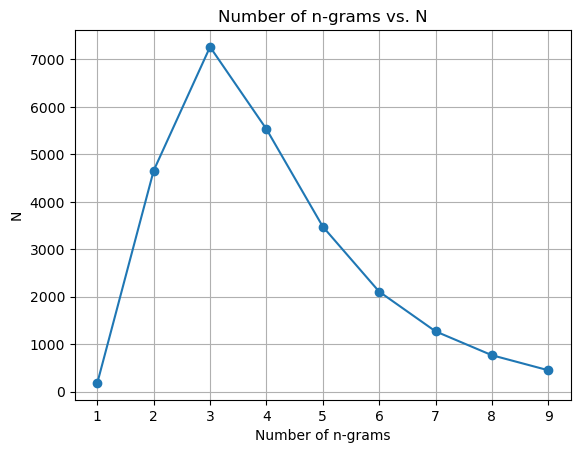

In [13]:
import matplotlib.pyplot as plt
x = np.arange(1, T+1)
y = [len(output[i]) for i in range(0, T)]
plt.plot(x, y, marker='o')
plt.xlabel('Number of n-grams')
plt.ylabel('N')
plt.title('Number of n-grams vs. N')
plt.grid()
plt.show()

# Reading the topical_chat dataset


Reading Topical Chat data...
Loaded 8628 conversations from Topical Chat dataset

Running with Delta = 1
Delta_0 :  1
Sigma_0 :  3.347811115753273
Rho_0 :  15.787862253816675
Length of Deltas :  9
Length of sigmas :  9
Length of rhos :  1
S1 length:  91
S2 length:  171
V3 :  1000
Length of supp_H3 :  539
B3 :  0
Completed 3th iteration
len(S3) :  209
V4 :  300
Length of supp_H4 :  279
B4 :  0
Completed 4th iteration
len(S4) :  152
V5 :  0
V5 is 0. Skipping iteration 5.
S4 is empty. Skipping iteration 6.
S5 is empty. Skipping iteration 7.
S6 is empty. Skipping iteration 8.
S7 is empty. Skipping iteration 9.
Plot saved to: plots/topical_chat_epsilon_4_Delta_1.png
N-grams saved to: n_grams/topical_chat_epsilon_4_Delta_1.pkl
Run completed for Delta = 1
N-gram lengths: [91, 171, 209, 152, 0, 0, 0, 0, 0]
Execution time: 25.11 seconds
Execution time: 0.42 minutes

Running with Delta = 5
Delta_0 :  5
Sigma_0 :  3.347811115753273
Rho_0 :  16.36077898137414
Length of Deltas :  9
Length of sigmas

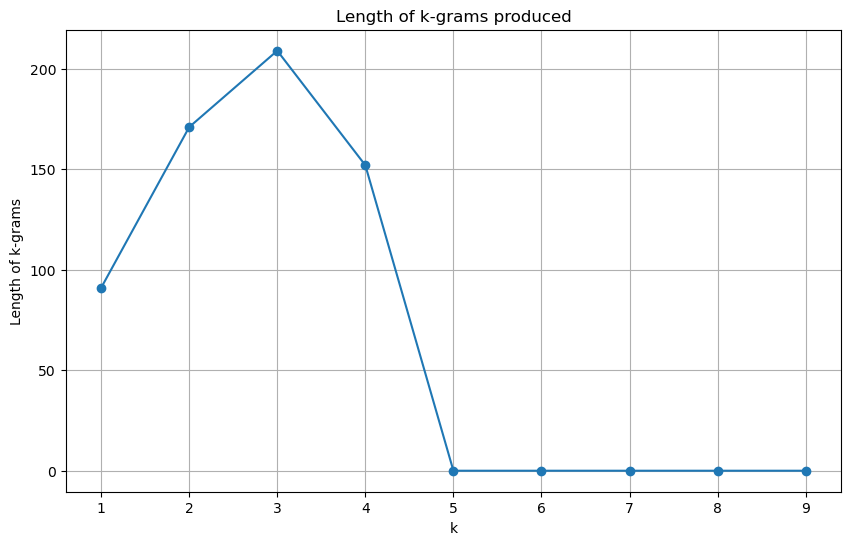

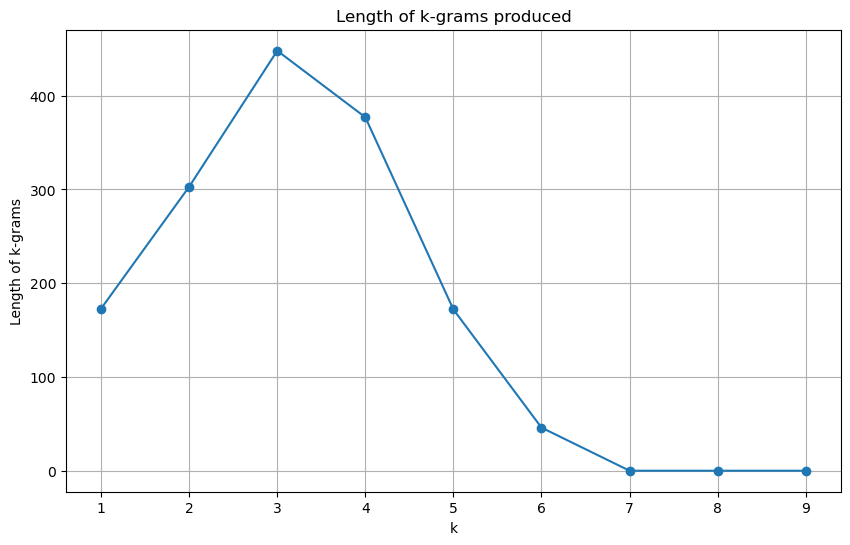

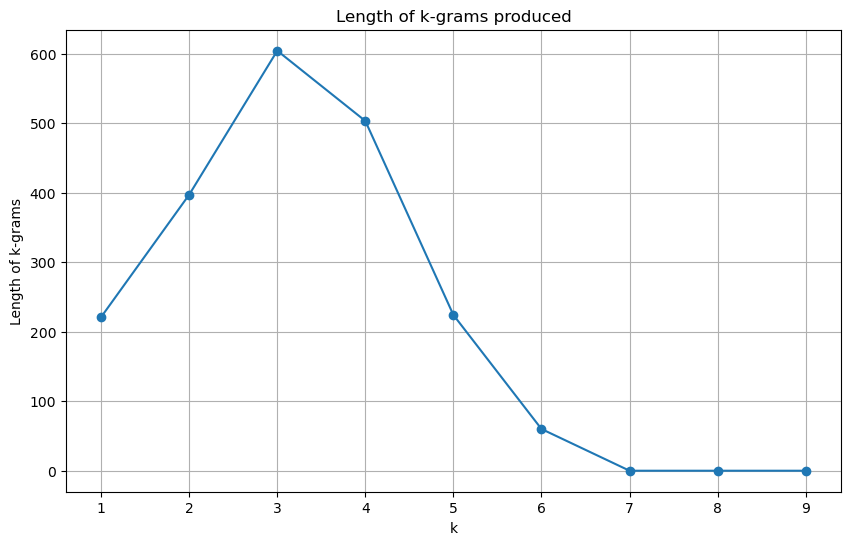

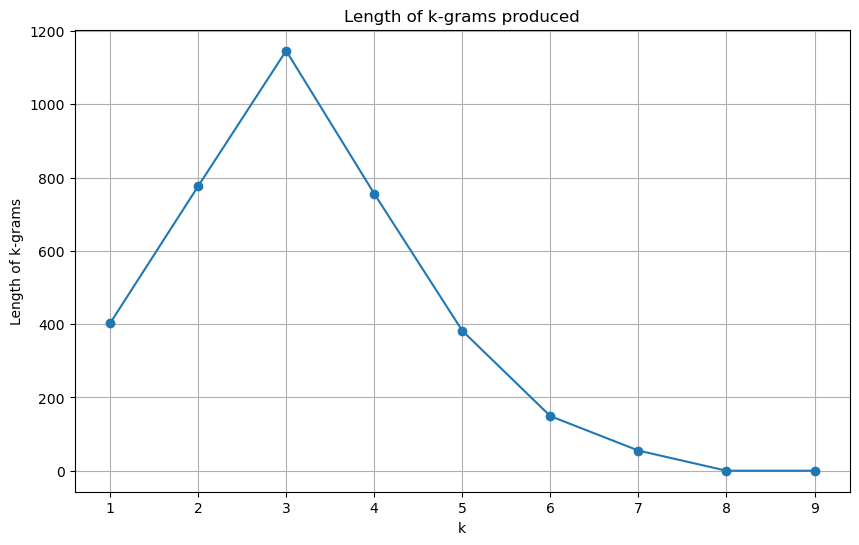

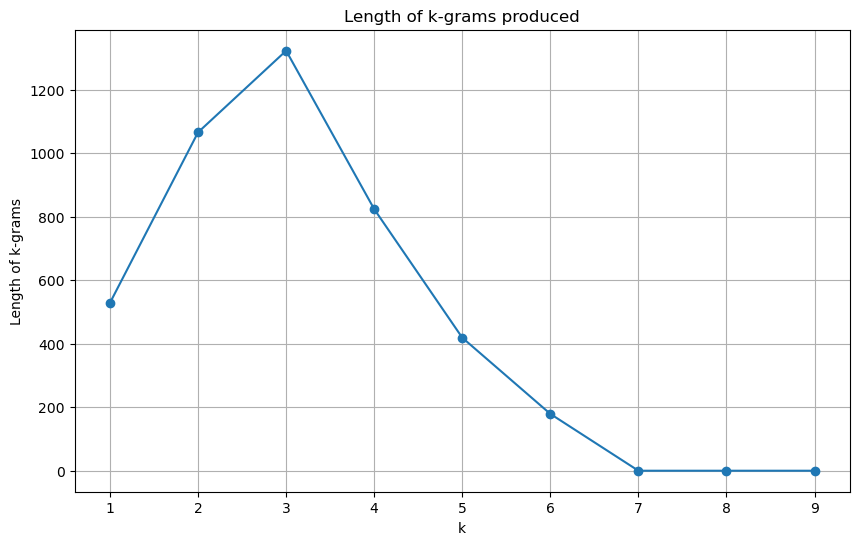

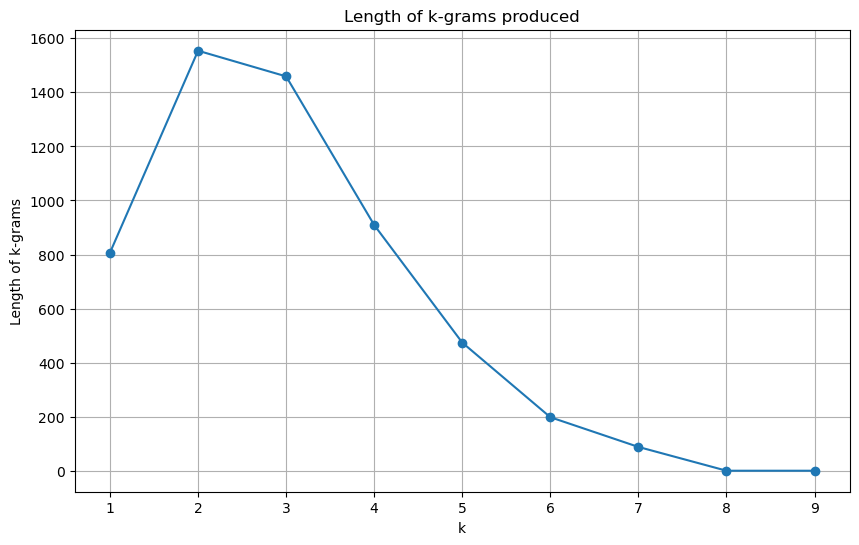

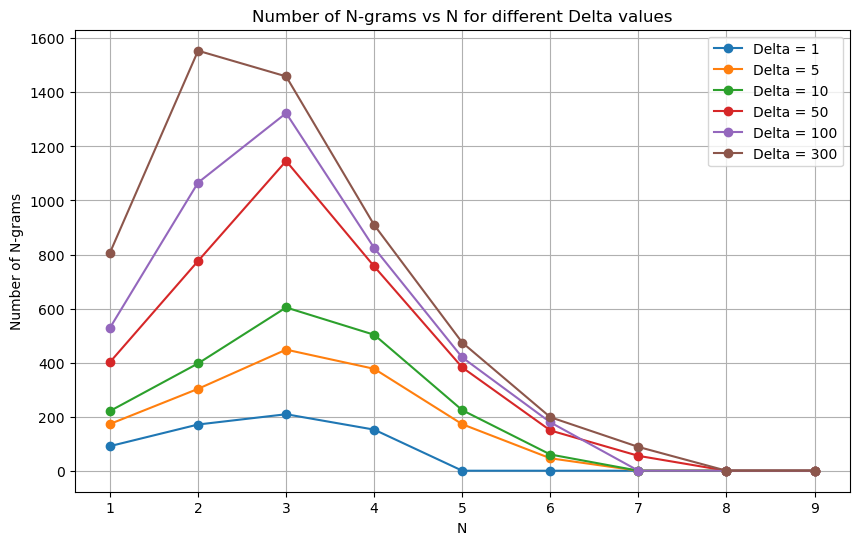

In [2]:
# Fixed parameters
epsilon = 4
delta = 1e-5
p = 0.01
T = 9

# Read the Topical Chat data
print("Reading Topical Chat data...")
file_path = os.path.join('topical_chat', 'topical_chat.csv')
df = pd.read_csv(file_path)

grouped = df.groupby('conversation_id')['message'].apply(lambda msgs: ' '.join(str(m) for m in msgs))
topical_data = grouped.tolist()
print(f"Loaded {len(topical_data)} conversations from Topical Chat dataset")

# List of Delta values to try
delta_values = [1, 5, 10, 50, 100, 300]

outputs = []

for delta_value in delta_values:
    print(f"\n{'='*50}")
    print(f"Running with Delta = {delta_value}")
    print(f"{'='*50}")
    
    # Start timing
    start_time = time.time()
    
    # Create DPNE instance with current Delta value
    dpne = DPNE(topical_data, epsilon, delta, p, T, Deltas=[delta_value]*T)
    
    # Generate filename based on epsilon and delta
    filename = f"topical_chat_epsilon_{epsilon}_Delta_{delta_value}"
    
    # Run the algorithm with the generated filename
    output = dpne.run(filename=filename)
    
    if output is not None:
        n_gram_lengths = [len(n_gram) for n_gram in output]
        outputs.append(n_gram_lengths)
        
        # Calculate elapsed time
        elapsed_time = time.time() - start_time
        
        print(f"Run completed for Delta = {delta_value}")
        print(f"N-gram lengths: {n_gram_lengths}")
        print(f"Execution time: {elapsed_time:.2f} seconds")
        print(f"Execution time: {elapsed_time/60:.2f} minutes")
    else:
        print(f"Failed run for Delta = {delta_value}")
        outputs.append([0] * T)  # Add placeholder for failed runs

# Plotting the results
if outputs:
    save_dir = os.path.join('plots', f"topical_chat_combined_epsilon_{epsilon}.png")
    plt.figure(figsize=(10, 6))
    
    for i, delta_value in enumerate(delta_values):
        if i < len(outputs):
            plt.plot(range(1, len(outputs[i])+1), outputs[i], marker='o', label=f'Delta = {delta_value}')
    
    plt.xlabel('N')
    plt.ylabel('Number of N-grams')
    plt.title('Number of N-grams vs N for different Delta values')
    plt.legend()
    plt.grid(True)
    plt.xticks(range(1, T+1))
    plt.savefig(save_dir)
    print(f"Combined plot saved to: {save_dir}")
else:
    print("No outputs to plot.")

Reading Topical Chat data...
Loaded 8628 conversations from Topical Chat dataset

Running with Epsilon = 1
Delta_0 :  300
Sigma_0 :  11.652422413813085
Rho_0 :  64.41360700464547
Length of Deltas :  9
Length of sigmas :  9
Length of rhos :  1
S1 length:  292
S2 length:  433
V3 :  4200
Length of supp_H3 :  3302
B3 :  2
Completed 3th iteration
len(S3) :  353
V4 :  500
Length of supp_H4 :  535
No need to add spurious k-grams for iteration 4.
Completed 4th iteration
len(S4) :  164
V5 :  0
V5 is 0. Skipping iteration 5.
S4 is empty. Skipping iteration 6.
S5 is empty. Skipping iteration 7.
S6 is empty. Skipping iteration 8.
S7 is empty. Skipping iteration 9.
Plot saved to: plots/topical_chat_epsilon_1_Delta_300.png
N-grams saved to: n_grams/topical_chat_epsilon_1_Delta_300.pkl
Run completed for Epsilon = 1
N-gram lengths: [292, 433, 353, 164, 0, 0, 0, 0, 0]
Execution time: 27.08 seconds
Execution time: 0.45 minutes

Running with Epsilon = 2
Delta_0 :  300
Sigma_0 :  6.201616978658076
Rho_0 :

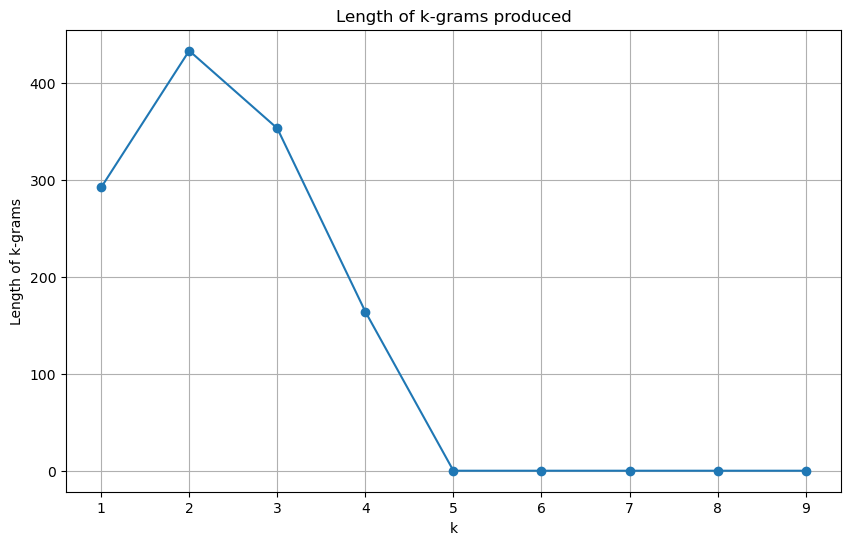

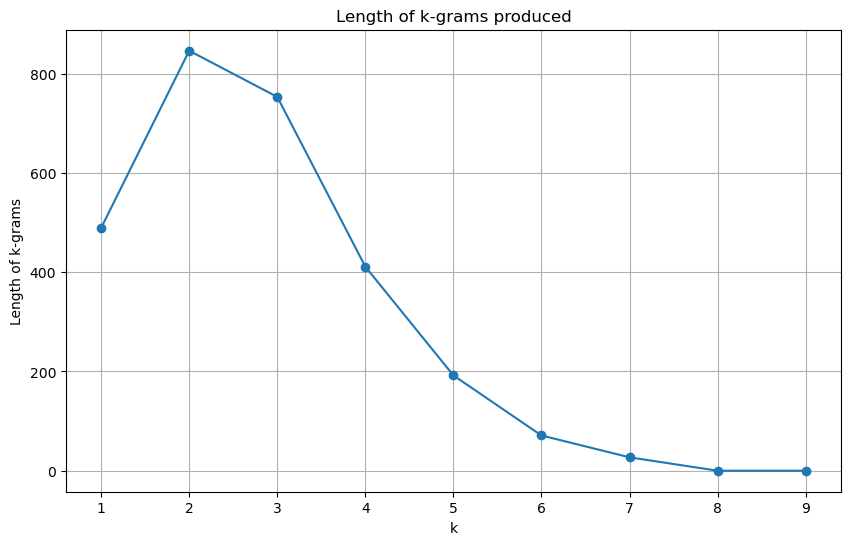

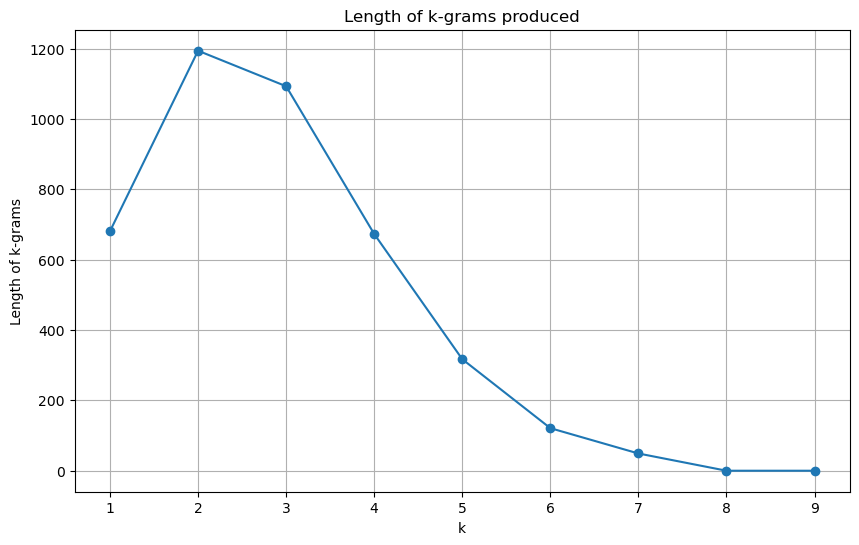

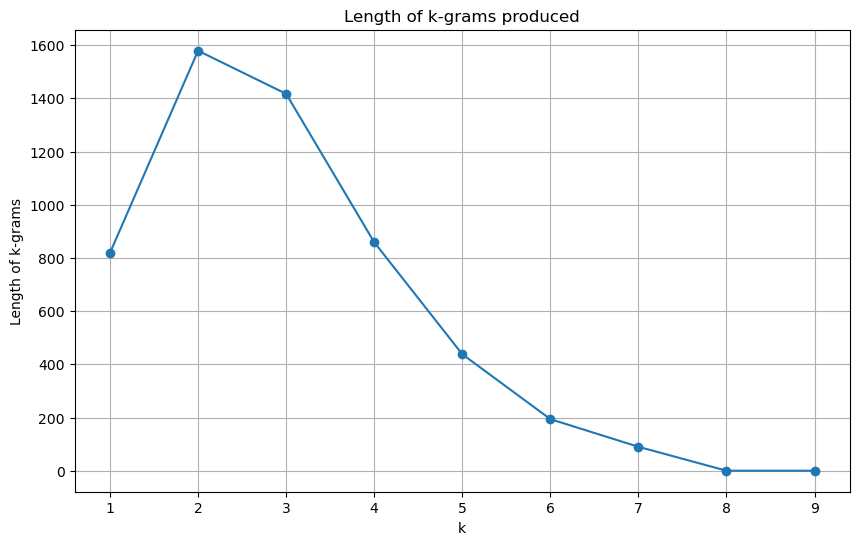

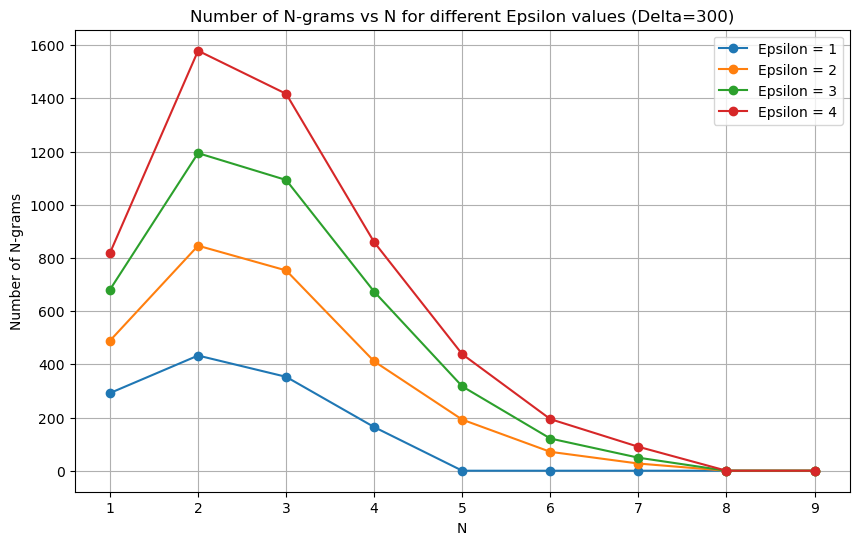

In [3]:
# Fixed parameters
delta = 1e-5
p = 0.01
T = 9

# Read the Topical Chat data
print("Reading Topical Chat data...")
file_path = os.path.join('topical_chat', 'topical_chat.csv')
df = pd.read_csv(file_path)

grouped = df.groupby('conversation_id')['message'].apply(lambda msgs: ' '.join(str(m) for m in msgs))
topical_data = grouped.tolist()
print(f"Loaded {len(topical_data)} conversations from Topical Chat dataset")

# Fixed Delta value for epsilon comparison
delta_value = 300

# List of Epsilon values to try
epsilon_values = [1, 2, 3, 4]

outputs = []

for epsilon in epsilon_values:
    print(f"\n{'='*50}")
    print(f"Running with Epsilon = {epsilon}")
    print(f"{'='*50}")
    
    # Start timing
    start_time = time.time()
    
    # Create DPNE instance with current Epsilon value
    dpne = DPNE(topical_data, epsilon, delta, p, T, Deltas=[delta_value]*T)
    
    # Generate filename based on epsilon and delta
    filename = f"topical_chat_epsilon_{epsilon}_Delta_{delta_value}"
    
    # Run the algorithm with the generated filename
    output = dpne.run(filename=filename)
    
    if output is not None:
        n_gram_lengths = [len(n_gram) for n_gram in output]
        outputs.append(n_gram_lengths)
        
        # Calculate elapsed time
        elapsed_time = time.time() - start_time
        
        print(f"Run completed for Epsilon = {epsilon}")
        print(f"N-gram lengths: {n_gram_lengths}")
        print(f"Execution time: {elapsed_time:.2f} seconds")
        print(f"Execution time: {elapsed_time/60:.2f} minutes")
    else:
        print(f"Failed run for Epsilon = {epsilon}")
        outputs.append([0] * T)  # Add placeholder for failed runs

# Plotting the results
if outputs:
    save_dir = os.path.join('plots', f"topical_chat_varying_epsilon_Delta_{delta_value}.png")
    plt.figure(figsize=(10, 6))
    
    for i, epsilon in enumerate(epsilon_values):
        if i < len(outputs):
            plt.plot(range(1, len(outputs[i])+1), outputs[i], marker='o', label=f'Epsilon = {epsilon}')
    
    plt.xlabel('N')
    plt.ylabel('Number of N-grams')
    plt.title(f'Number of N-grams vs N for different Epsilon values (Delta={delta_value})')
    plt.legend()
    plt.grid(True)
    plt.xticks(range(1, T+1))
    plt.savefig(save_dir)
    print(f"Combined plot saved to: {save_dir}")
else:
    print("No outputs to plot.")

In [ ]:
# Fixed parameters
epsilon = 4
delta = 1e-5
p = 0.01
T = 9

# Read the Topical Chat data
print("Reading Topical Chat data...")
file_path = os.path.join('topical_chat', 'topical_chat.csv')
df = pd.read_csv(file_path)

grouped = df.groupby('conversation_id')['message'].apply(lambda msgs: ' '.join(str(m) for m in msgs))
topical_data = grouped.tolist()
print(f"Loaded {len(topical_data)} conversations from Topical Chat dataset")

# Fixed Delta value
delta_value = 300

# List of eta values to try
eta_values = [0.005, 0.01, 0.05, 0.1, 0.2]

outputs = []

for eta in eta_values:
    print(f"\n{'='*50}")
    print(f"Running with eta = {eta}")
    print(f"{'='*50}")
    
    # Start timing
    start_time = time.time()
    
    # Create DPNE instance with current eta value
    dpne = DPNE(topical_data, epsilon, delta, p, T, eta=eta, Deltas=[delta_value]*T)
    
    # Generate filename based on epsilon, delta and eta
    filename = f"topical_chat_epsilon_{epsilon}_Delta_{delta_value}_eta_{eta}"
    
    # Run the algorithm with the generated filename
    output = dpne.run(filename=filename)
    
    if output is not None:
        n_gram_lengths = [len(n_gram) for n_gram in output]
        outputs.append(n_gram_lengths)
        
        # Calculate elapsed time
        elapsed_time = time.time() - start_time
        
        print(f"Run completed for eta = {eta}")
        print(f"N-gram lengths: {n_gram_lengths}")
        print(f"Execution time: {elapsed_time:.2f} seconds")
        print(f"Execution time: {elapsed_time/60:.2f} minutes")
    else:
        print(f"Failed run for eta = {eta}")
        outputs.append([0] * T)  # Add placeholder for failed runs

# Plotting the results
if outputs:
    save_dir = os.path.join('plots', f"topical_chat_varying_eta_epsilon_{epsilon}_Delta_{delta_value}.png")
    plt.figure(figsize=(10, 6))
    
    for i, eta in enumerate(eta_values):
        if i < len(outputs):
            plt.plot(range(1, len(outputs[i])+1), outputs[i], marker='o', label=f'eta = {eta}')
    
    plt.xlabel('N')
    plt.ylabel('Number of N-grams')
    plt.title(f'Number of N-grams vs N for different eta values (ε={epsilon}, Δ={delta_value})')
    plt.legend()
    plt.grid(True)
    plt.xticks(range(1, T+1))
    plt.savefig(save_dir)
    print(f"Combined plot saved to: {save_dir}")
else:
    print("No outputs to plot.")

# Checking the extracted N-Grams

In [3]:
import pickle
import os

file = os.path.join('n_grams', 'topical_chat_epsilon_4_Delta_300.pkl')

# Read from the saved pkl file for the Topical Chat dataset
with open(file, 'rb') as f:
    n_grams = pickle.load(f)

for i in range(len(n_grams)):
    print(f"Number of {i+1}-grams: {len(n_grams[i])}")
    print(f"First 5 {i+1}-grams: {list(n_grams[i])[:5]}")
    print()

Number of 1-grams: 819
First 5 1-grams: ['disney', 'news', 'genius', 'them', 'social']

Number of 2-grams: 1579
First 5 2-grams: ['show i', 'the second', 'think it', 'the record', 'was it']

Number of 3-grams: 1417
First 5 3-grams: ['i like them', 'surprised that only', 'ill have to', 'i have a', 'wonder how it']

Number of 4-grams: 859
First 5 4-grams: ['you know there was', 'hi do you watch', 'i have never been', 'in a lot of', 'i never heard of']

Number of 5-grams: 438
First 5 5-grams: ['so do you like to', 'do you like to read', 'how about you i love', 'hi do you watch the', 'but i did not know']

Number of 6-grams: 194
First 5 6-grams: ['it was nice talking to you', 'its been nice chatting with you', 'i think that would be a', 'been great chatting with you have', 'well it was good talking to']

Number of 7-grams: 90
First 5 7-grams: ['it was nice chatting with you too', 'chatting with you have a nice day', 'great chatting with you too have a', 'did you know there is a website', '